# Introduction


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import kaggle
%matplotlib inline

# Data wrangling
## Download datasets from Kaggle and unzip them locally

In [3]:
!kaggle datasets download -d airbnb/boston -p ./boston
!kaggle datasets download -d airbnb/seattle -p ./seattle
!unzip ./boston/boston.zip -d ./boston
!unzip ./seattle/seattle.zip -d ./seattle

Dataset URL: https://www.kaggle.com/datasets/airbnb/boston
License(s): CC0-1.0
boston.zip: Skipping, found more recently modified local copy (use --force to force download)
Dataset URL: https://www.kaggle.com/datasets/airbnb/seattle
License(s): CC0-1.0
seattle.zip: Skipping, found more recently modified local copy (use --force to force download)


In [5]:
df_boston = pd.read_csv("./boston/listings.csv")
df_seattle = pd.read_csv("./seattle/listings.csv")

### This is an example record, we can use this as a rough template to see what variables we want to use in our analysis

In [7]:
with pd.option_context('display.max_rows',None,'display.max_columns',None): 
    display(df_boston.loc[1,:])

id                                                                            3075044
listing_url                                      https://www.airbnb.com/rooms/3075044
scrape_id                                                              20160906204935
last_scraped                                                               2016-09-07
name                                                Charming room in pet friendly apt
summary                             Charming and quiet room in a second floor 1910...
space                               Small but cozy and quite room with a full size...
description                         Charming and quiet room in a second floor 1910...
experiences_offered                                                              none
neighborhood_overview               The room is in Roslindale, a diverse and prima...
notes                               If you don't have a US cell phone, you can tex...
transit                             Plenty of safe str

## Compare column headers for both data frames and drop extras

In [9]:
df_boston.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'access', 'interaction', 'house_rules',
       'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url',
       'host_id', 'host_url', 'host_name', 'host_since', 'host_location',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url',
       'host_picture_url', 'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'street',
       'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms',

In [11]:
df_seattle.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'thumbnail_url', 'medium_url', 'picture_url',
       'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since',
       'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', '

### The Seattle data doesn't have any columns that the Boston one doesn't contain

In [13]:
df_seattle.columns.difference(df_boston.columns)

Index([], dtype='object')

### The Boston data has three extra columns. These are text fields, so we won't use them in this data analysis and will be fine to drop them from the data frame.

In [15]:
df_boston.columns.difference(df_seattle.columns)

Index(['access', 'house_rules', 'interaction'], dtype='object')

In [17]:
cols = ['access', 'interaction', 'house_rules']
df_boston.drop(cols, axis=1, inplace=True)

## Drop columns that don't have data we want to include

In [19]:
cols = ['listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'thumbnail_url', 'medium_url', 'picture_url', 
       'xl_picture_url', 'host_url', 'host_name', 'host_about', 'host_thumbnail_url', 
       'host_picture_url', 'calendar_last_scraped', 'first_review', 'last_review']
df_boston.drop(cols, axis=1, inplace=True)
df_seattle.drop(cols, axis=1, inplace=True)

## Find and drop columns that are mostly filled with missing data

In [21]:
total = df_boston.isnull().sum().sort_values(ascending=False)
percent = (df_boston.isnull().sum()/df_boston.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data_filtered = missing_data[missing_data['Percent']>.25]
missing_data_filtered.head(15)

,Total,Percent
has_availability,3585,1.000000
jurisdiction_names,3585,1.000000
license,3585,1.000000
neighbourhood_group_cleansed,3585,1.000000
square_feet,3529,0.984379
monthly_price,2697,0.752301
weekly_price,2693,0.751185
security_deposit,2243,0.625662
cleaning_fee,1107,0.308787


In [23]:
total = df_seattle.isnull().sum().sort_values(ascending=False)
percent = (df_seattle.isnull().sum()/df_seattle.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data_filtered = missing_data[missing_data['Percent']>.25]
missing_data_filtered.head(15)

,Total,Percent
license,3818,1.000000
square_feet,3721,0.974594
monthly_price,2301,0.602672
security_deposit,1952,0.511262
weekly_price,1809,0.473808
cleaning_fee,1030,0.269775


## Note that we're dropping all the variables with more than 50% missing values from both datasets

In [25]:
cols = ['has_availability', 'jurisdiction_names', 'license',
        'neighbourhood_group_cleansed', 'square_feet', 'monthly_price',
        'weekly_price','security_deposit']
df_boston.drop(cols, axis=1, inplace=True)
df_seattle.drop(cols, axis=1, inplace=True)

In [27]:
df_boston.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3585 entries, 0 to 3584
Data columns (total 61 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                3585 non-null   int64  
 1   host_id                           3585 non-null   int64  
 2   host_since                        3585 non-null   object 
 3   host_location                     3574 non-null   object 
 4   host_response_time                3114 non-null   object 
 5   host_response_rate                3114 non-null   object 
 6   host_acceptance_rate              3114 non-null   object 
 7   host_is_superhost                 3585 non-null   object 
 8   host_neighbourhood                3246 non-null   object 
 9   host_listings_count               3585 non-null   int64  
 10  host_total_listings_count         3585 non-null   int64  
 11  host_verifications                3585 non-null   object 
 12  host_h

## Heatmap of missing values

In [29]:
df_boston_nulls = df_boston.loc[:,df_boston.isnull().any()]
df_boston_nulls.columns

Index(['host_location', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_neighbourhood', 'neighbourhood', 'city',
       'zipcode', 'market', 'property_type', 'bathrooms', 'bedrooms', 'beds',
       'cleaning_fee', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'reviews_per_month'],
      dtype='object')

<Axes: >

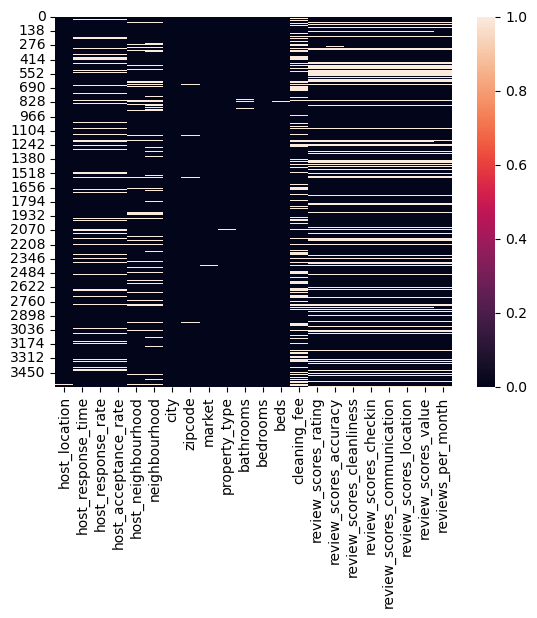

In [68]:
sns.heatmap(df_boston_nulls.isnull())

<Axes: >

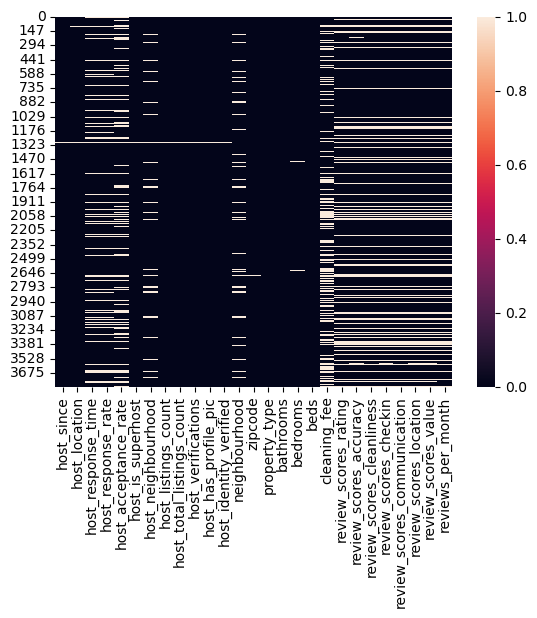

In [31]:
df_seattle_nulls = df_seattle.loc[:,df_seattle.isnull().any()]
sns.heatmap(df_seattle_nulls.isnull())

### We may want to be careful including variables that still contain many missing values. It does appear that the variables that contain null values are relatively consistent across both data sets.

## Change data types to numeric values for percent and price

In [33]:
cols = ['host_response_rate', 'host_acceptance_rate', 'price',
        'cleaning_fee', 'extra_people']
for col in cols:
    df_boston[col] = df_boston[col].str.extract('(\d+)')
    df_boston[col] = pd.to_numeric(df_boston[col])
    df_seattle[col] = df_seattle[col].str.extract('(\d+)')
    df_seattle[col] = pd.to_numeric(df_seattle[col])
df_boston[cols].head()

,host_response_rate,host_acceptance_rate,price,cleaning_fee,extra_people
0,NaN,NaN,250,35.0,0
1,100.0,100.0,65,10.0,0
2,100.0,88.0,65,NaN,20
3,100.0,50.0,75,50.0,25
4,100.0,100.0,79,15.0,0


## Updated record of wrangled data

In [35]:
with pd.option_context('display.max_rows',None,'display.max_columns',None): 
    display(df_boston.loc[1,:])

id                                                                            3075044
host_id                                                                       2572247
host_since                                                                 2012-06-07
host_location                                    Boston, Massachusetts, United States
host_response_time                                                     within an hour
host_response_rate                                                              100.0
host_acceptance_rate                                                            100.0
host_is_superhost                                                                   f
host_neighbourhood                                                         Roslindale
host_listings_count                                                                 1
host_total_listings_count                                                           1
host_verifications                  ['email', 'phone',

# Pricing Analysis
### I want to examine pricing across these two markets over many variables. First, we'll take a look at how pricing changes based on the type of rental.
## Distribution of room types of Airbnb rentals in both markets

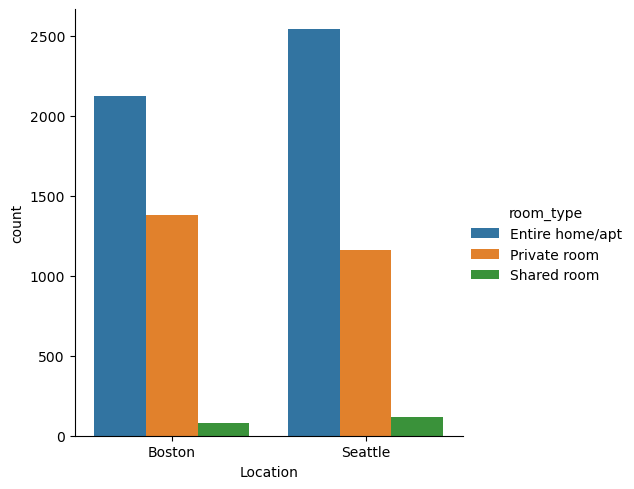

In [37]:
room_types_boston = pd.DataFrame(df_boston['room_type'])
room_types_boston['Location'] = 'Boston'
room_types_seattle = pd.DataFrame(df_seattle['room_type'])
room_types_seattle['Location'] = 'Seattle'
room_types_joined = pd.concat([room_types_boston,room_types_seattle], axis=0)

sns.catplot(kind='count',
            data = room_types_joined,
            x='Location',
            hue = 'room_type')

### It would appear the the distribution of room types is similar across both markets.
## Distribution of property types across Airbnb rentals

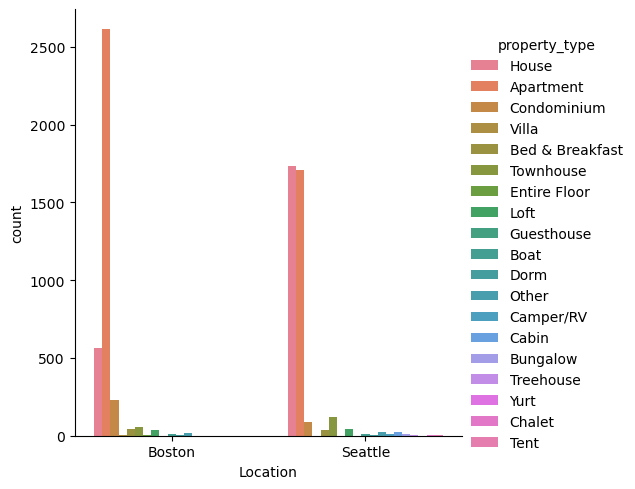

In [39]:
prop_types_boston = pd.DataFrame(df_boston['property_type'])
prop_types_boston['Location'] = 'Boston'
prop_types_seattle = pd.DataFrame(df_seattle['property_type'])
prop_types_seattle['Location'] = 'Seattle'
prop_types_joined = pd.concat([prop_types_boston,prop_types_seattle], axis=0)

sns.catplot(kind='count',
            data = prop_types_joined,
            x='Location',
            hue = 'property_type')

### Houses, apartments, and condominiums make up the majority of property types, with Boston having majority apartments and Seattle having similar apartment and house rentals. Note that Seattle has more townhouse rentals than condominiums. Let's take a deeper look at the top four property types in both markets.

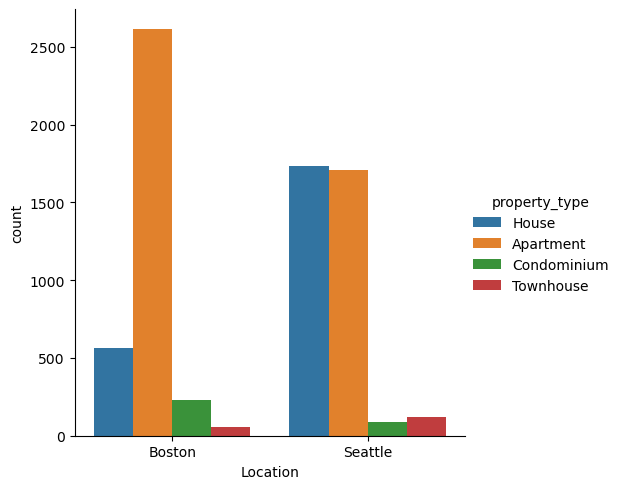

In [41]:
type_filter = ['House','Apartment','Condominium','Townhouse']
prop_types_joined_trunc = prop_types_joined.loc[prop_types_joined['property_type'].isin(type_filter)]


sns.catplot(kind='count',
            data = prop_types_joined_trunc,
            x='Location',
            hue = 'property_type')

### This is much more readable. For comparative purposes, let's recast this data as proportion of total listings.

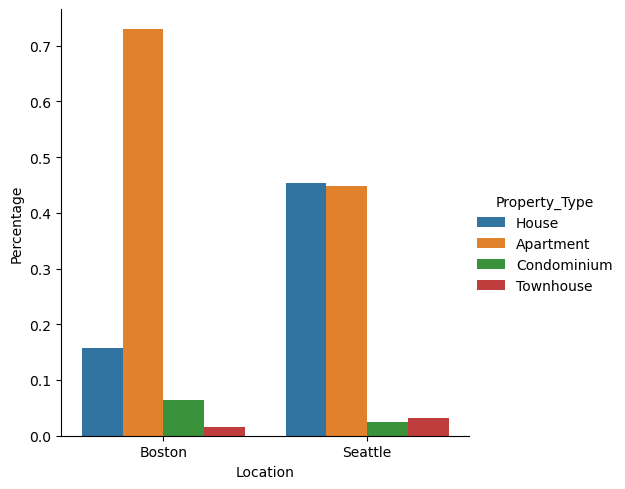

In [43]:
boston_prop_counts = df_boston['property_type'].value_counts()
boston_prop_types = boston_prop_counts/sum(boston_prop_counts)
seattle_prop_counts = df_seattle['property_type'].value_counts()
seattle_prop_types = seattle_prop_counts/sum(seattle_prop_counts)

df_prop_pricing = pd.DataFrame(data={'Location':['Boston','Seattle'],
                                     'House':[boston_prop_types['House'],seattle_prop_types['House']],
                                     'Apartment':[boston_prop_types['Apartment'],seattle_prop_types['Apartment']],
                                     'Condominium':[boston_prop_types['Condominium'],seattle_prop_types['Condominium']],
                                     'Townhouse':[boston_prop_types['Townhouse'],seattle_prop_types['Townhouse']]})

df_prop_pricing_melt = pd.melt(df_prop_pricing, id_vars='Location')
df_prop_pricing_melt = df_prop_pricing_melt.rename(columns={'variable':'Property_Type',
                                                             'value':'Percentage'})
                                                            
sns.catplot(data = df_prop_pricing_melt,
            x = 'Location',
            y = 'Percentage',
            hue = 'Property_Type',
            kind = 'bar')

### Note that these values are normalized to each market; for instance, over 70% of rentals *in Boston* are apartments.

## Pricing trends over property and room types

<Axes: xlabel='property_type', ylabel='price'>

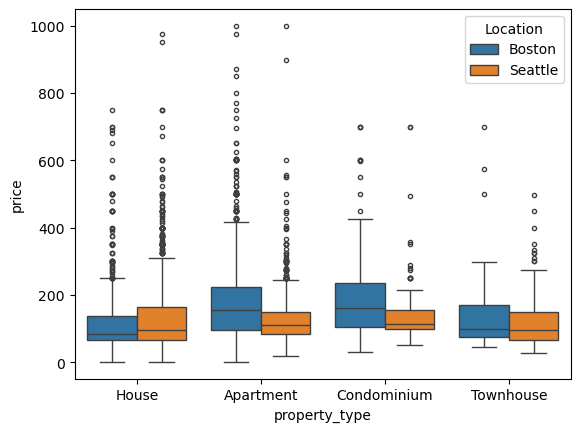

In [45]:
price_df_boston = pd.DataFrame(df_boston[['price','room_type','property_type']])
price_df_boston['Location'] = 'Boston'
price_df_seattle = pd.DataFrame(df_seattle[['price','room_type','property_type']])
price_df_seattle['Location'] = 'Seattle'
price_df_joined = pd.concat([price_df_boston,price_df_seattle], axis=0)

price_df_joined_trunc = price_df_joined.loc[price_df_joined['property_type'].isin(type_filter)]

sns.boxplot(data = price_df_joined_trunc,
            x = 'property_type',
            y = 'price',
            hue = 'Location',
            fliersize=3)

### Pricing appears to be slightly higher, overall, in Boston. Houses in Seattle tend to run a bit more expensive than those in Boston, although there are many more houses in Seattle than in Boston. I do find it interesting that houses are the least expensive option in Boston.

<Axes: xlabel='room_type', ylabel='price'>

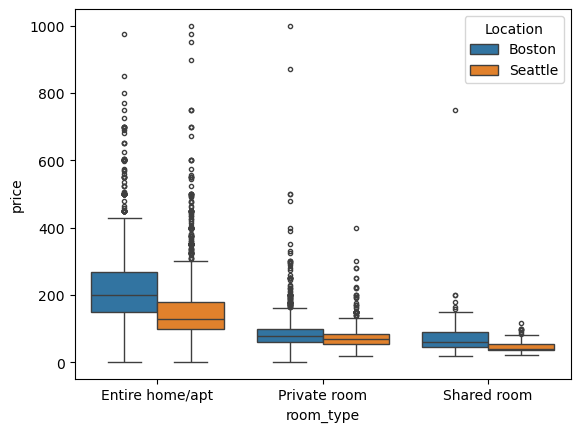

In [47]:
sns.boxplot(data = price_df_joined_trunc,
            x = 'room_type',
            y = 'price',
            hue = 'Location',
            fliersize=3)

### When braking prices down by room type, we can see that Boston is the more expensive market across all room types. In reference to the previous chart, I would imagine that houses are less expensive in the Boston market due to geographical features. Perhaps looking at location would lend some more insight into both the unexpected pricing and the imbalance of houses to apartments in Boston.

Text(0.5, 1.0, 'Boston')

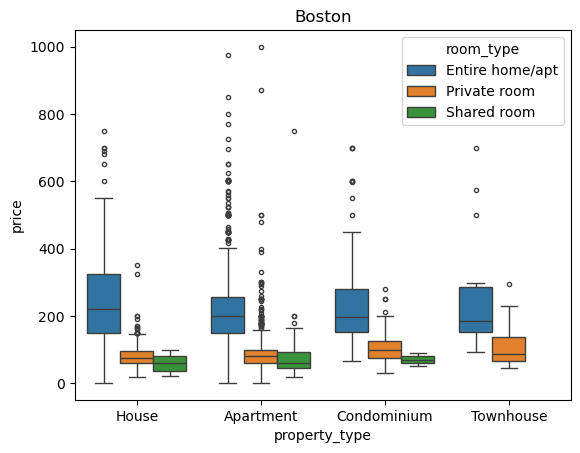

In [49]:
sns.boxplot(data = price_df_joined_trunc.loc[price_df_joined_trunc['Location']=='Boston'],
            x = 'property_type',
            y = 'price',
            hue = 'room_type',
            fliersize=3)
plt.title('Boston')

Text(0.5, 1.0, 'Seattle')

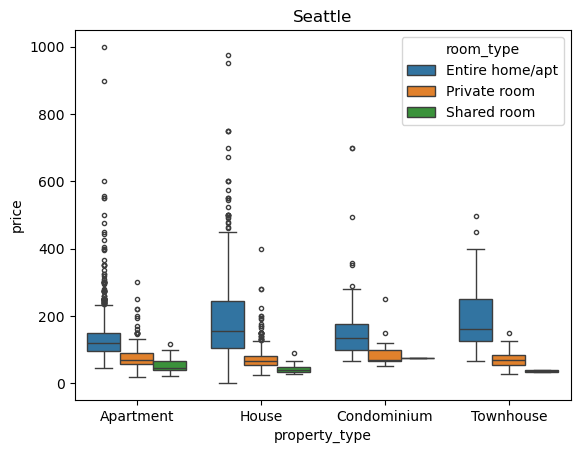

In [51]:
sns.boxplot(data = price_df_joined_trunc.loc[price_df_joined_trunc['Location']=='Seattle'],
            x = 'property_type',
            y = 'price',
            hue = 'room_type',
            fliersize=3)
plt.title('Seattle')

### Comparing these two charts does show that, overall, the Boston market is more expensive across all metrics. It would appear that the addition of private and shared rooms to the house pricing distribution has significantly decreased the median price for a house rental in the Boston market as seen in the comparitive property type pricing chart above.

## Geographic Pricing Trends

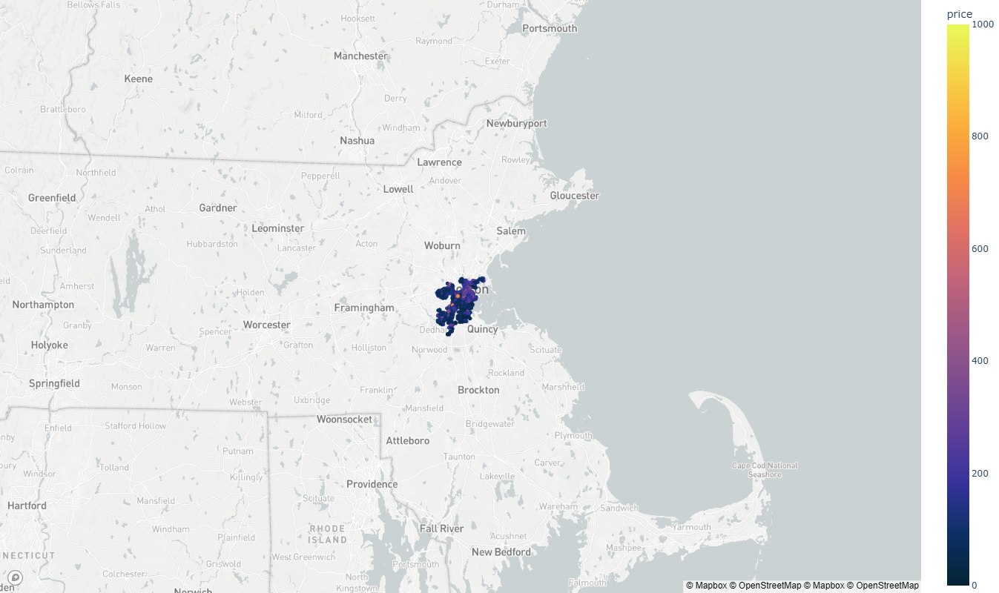

In [53]:
px.set_mapbox_access_token("pk.eyJ1Ijoia2thcmJhY2giLCJhIjoiY2x6cmcwODA2MDZpZTJyb25xaXZpanhydyJ9.M_NINK4dMqEUUdfe1Kdmqw")
fig = px.scatter_mapbox(df_boston,
                        lat = 'latitude',
                        lon = 'longitude',
                        color = 'price',
                        color_continuous_scale=px.colors.sequential.thermal,
                        range_color=(0,1000),
                        width = 800,
                        height = 800)
# fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

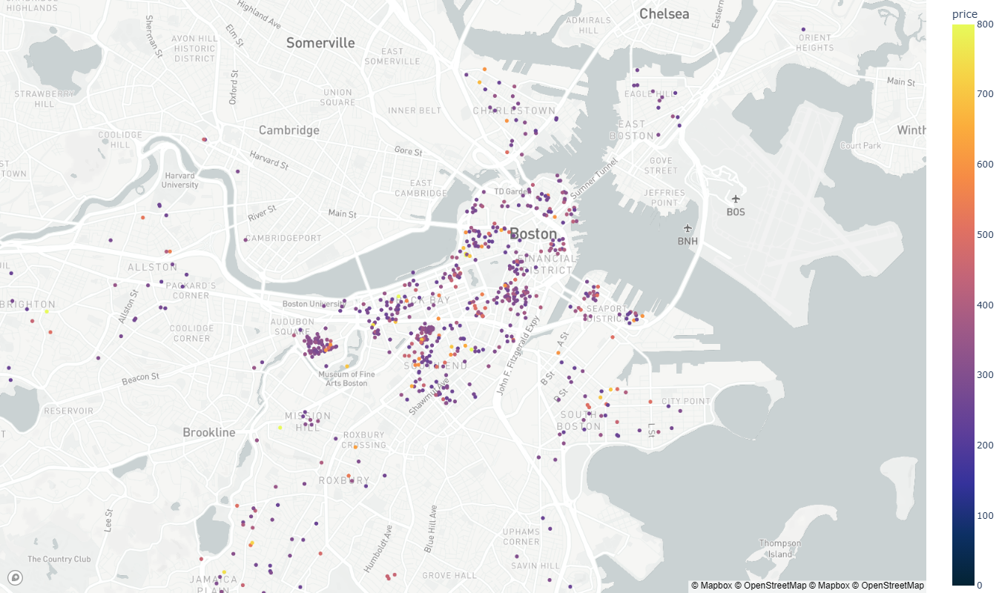

In [221]:
boston_price_filter = df_boston['price'].quantile(.8)

fig = px.scatter_mapbox(df_boston[df_boston['price']>boston_price_filter],
                        lat = 'latitude',
                        lon = 'longitude',
                        color = 'price',
                        color_continuous_scale=px.colors.sequential.thermal,
                        range_color=(0,800),
                        width = 800,
                        height = 800)
# fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

### The first chart shows all the properties in the Boston market colored by price. The second shows the 20% most expensive properties. This more clearly shows the density of properties in the high-priced areas of town.

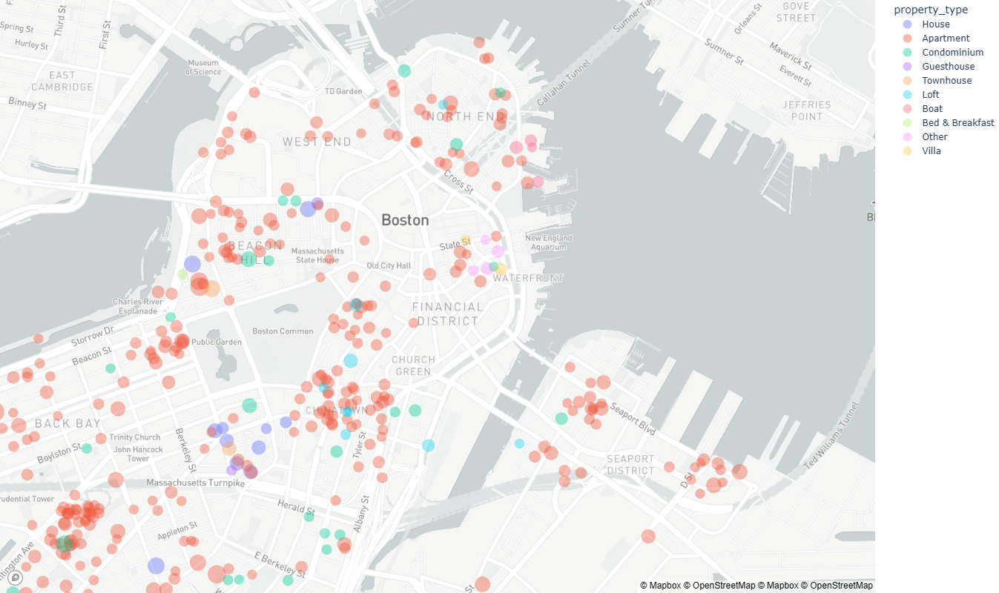

In [316]:
fig = px.scatter_mapbox(df_boston[df_boston['price']>boston_price_filter],
                        lat = 'latitude',
                        lon = 'longitude',
                        color = 'property_type',
                        color_discrete_sequence = px.colors.qualitative.Plotly,
                        size = 'price',
                        opacity=.4,
                        width = 800,
                        height = 800)
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

### We can see that apartments and condos dominate the market towards downtown, with houses further out. Scaling the point size by price and setting transparancy allows us to have some visual intuition about which areas are dominated by the most expensive rentals.

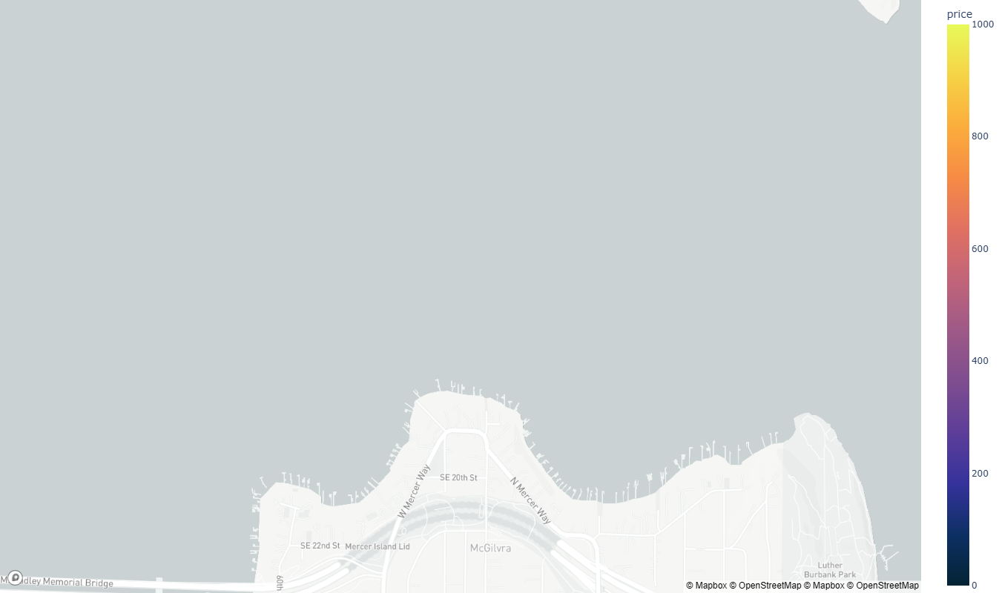

In [322]:
fig = px.scatter_mapbox(df_seattle,
                        lat = 'latitude',
                        lon = 'longitude',
                        color = 'price',
                        color_continuous_scale=px.colors.sequential.thermal,
                        range_color=(0,1000),
                        width = 800,
                        height = 800)
# fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

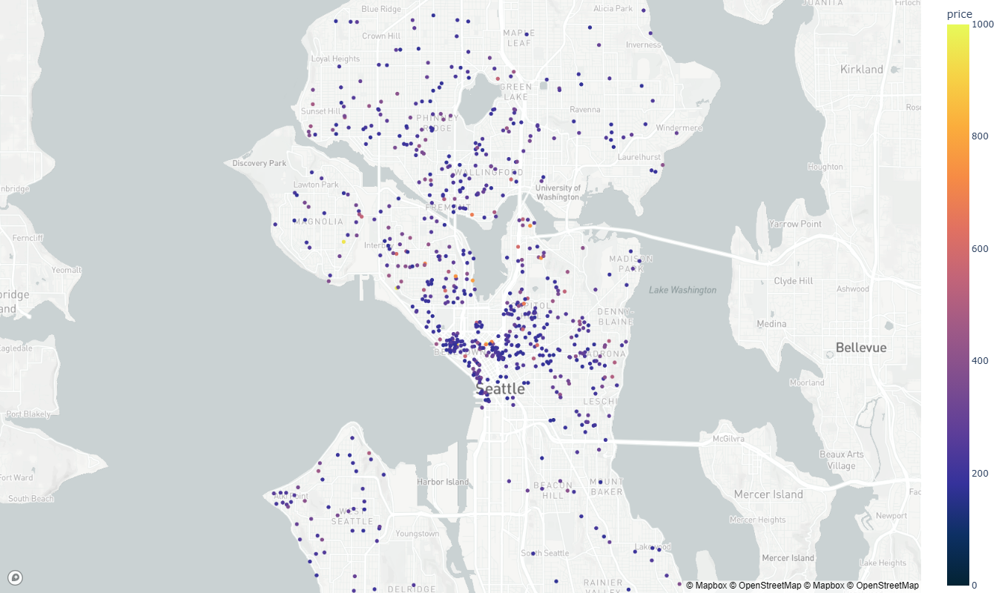

In [229]:
seattle_price_filter = df_seattle['price'].quantile(.8)

fig = px.scatter_mapbox(df_seattle[df_seattle['price']>seattle_price_filter],
                        lat = 'latitude',
                        lon = 'longitude',
                        color = 'price',
                        color_continuous_scale=px.colors.sequential.thermal,
                        range_color=(0,1000),
                        width = 800,
                        height = 800)
# fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

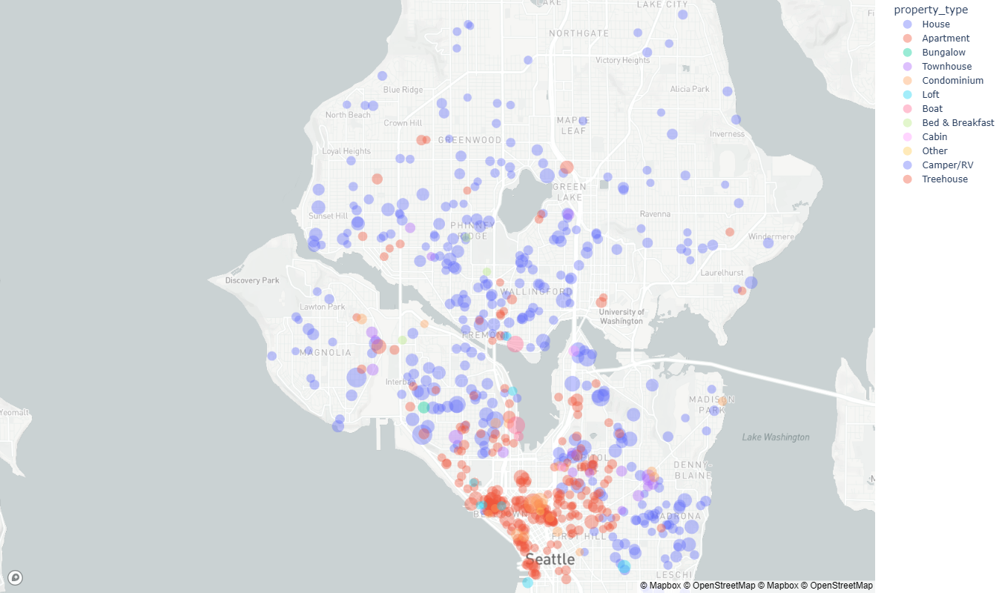

In [319]:
fig = px.scatter_mapbox(df_seattle[df_seattle['price']>seattle_price_filter],
                        lat = 'latitude',
                        lon = 'longitude',
                        color = 'property_type',
                        size = 'price',
                        opacity = .4,
                        width = 800,
                        height = 800)
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

### We see very similar geographic information in the Seattle market -- downtown is dominated by apartments, lofts, and condos, while houses are further from the city center. The main difference that is visible are the far greater number of houses in the Seattle market, especially in the suburbs north of the channel.

# Examine numeric variables that affect the price of a rental using multiple linear regression

### First, we will recast our data into a dataframe that only contains numeric data and begin to work with records with empty data.

<Axes: >

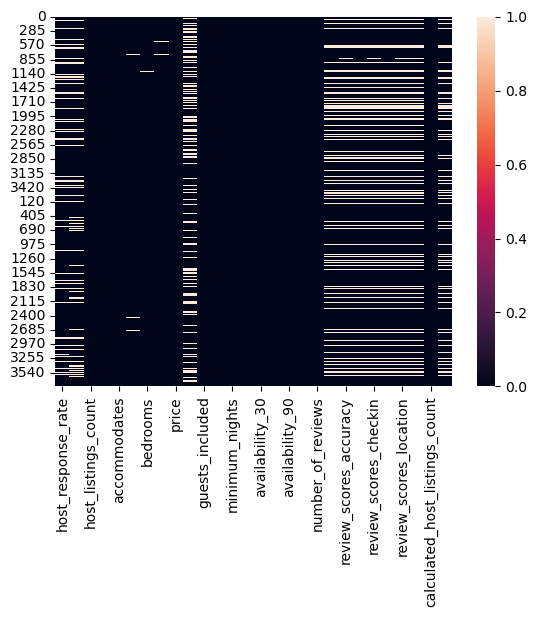

In [55]:
df_boston_numeric = df_boston.select_dtypes(include='number')
df_seattle_numeric = df_seattle.select_dtypes(include='number')
droplist = ['id', 'host_id', 'latitude', 'longitude']
df_boston_numeric = df_boston_numeric.drop(droplist,axis=1)
df_seattle_numeric = df_seattle_numeric.drop(droplist,axis=1)
df_numeric_combined = pd.concat([df_boston_numeric,df_seattle_numeric],axis=0)
sns.heatmap(df_numeric_combined.isnull())

In [57]:
total = df_numeric_combined.isnull().sum().sort_values(ascending=False)
percent = (df_numeric_combined.isnull().sum()/df_numeric_combined.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data_filtered = missing_data[missing_data['Percent']>0]
missing_data_filtered.head(15)

,Total,Percent
cleaning_fee,2137,0.288667
review_scores_accuracy,1481,0.200054
review_scores_checkin,1478,0.199649
review_scores_value,1477,0.199514
review_scores_location,1477,0.199514
review_scores_cleanliness,1471,0.198703
review_scores_communication,1469,0.198433
review_scores_rating,1460,0.197217
reviews_per_month,1383,0.186816
host_acceptance_rate,1244,0.168040


### Empty values will be filled with the median of the feature. This was the chosen method to attempt to maintain the linear relationship of data that fall further from the median values.

<Axes: >

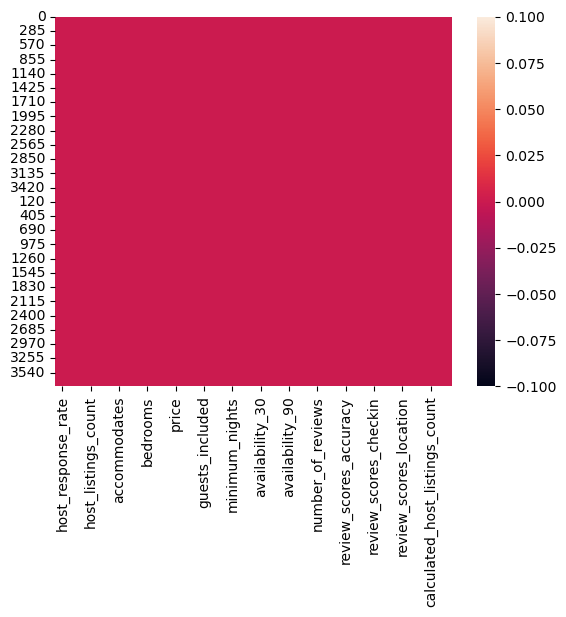

In [59]:
colnames = list(missing_data_filtered.index)
df_numeric_filled = df_numeric_combined
for i in colnames:
    df_numeric_filled[i] = df_numeric_filled[i].fillna(df_numeric_filled[i].median())
sns.heatmap(df_numeric_filled.isnull())

### This figure shows the correlations between all the numeric data in the frame. Note the areas of high multicorrelation.

<Axes: >

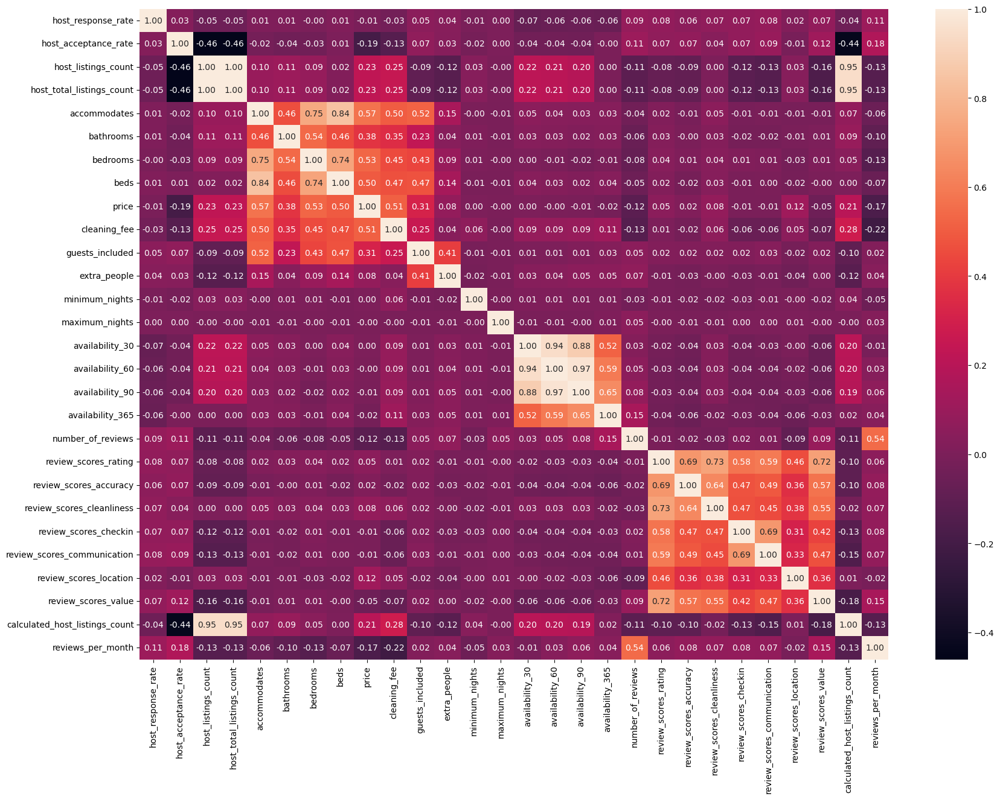

In [61]:
plt.figure(figsize=(20,14))
sns.heatmap(df_numeric_filled.corr(),
            annot=True,
            fmt='.2f')

# Regression modeling

### Now we will begin modeling the data, first using all the features as predictor variables

In [65]:
from sklearn import linear_model
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import root_mean_squared_error, mean_absolute_error 

In [102]:
def run_linear_model(X,y,constant=True,test_size=0.3,random_seed=None):
    '''
    run_linear_model is a function to fit an Ordinary Least Squares model (from Python's statsmodels library) to a training set of the provided data.
    
    Inputs:  
            X: [n by k] array of n observations and k predictor variables.
            y: [n by 1] array of n observations for the response variable.
    
    Optional inputs:
            const: Whether or not there should be an intercept present in the OLS model.
            test_size: The proportion in the range [0,1] for the data to be included in the test split. The remaining data is in the training split.
            random_seed: Allows the user to set the random seed of the train_test_split function for repeatability.
            
    Output:
        output_dict: a dictionary containing the linear model, the predictions using the model, RMS error, and Mean Absolute Error
    '''
    import statsmodels.api as sm
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import root_mean_squared_error, mean_absolute_error
    
    if constant: #adds a constant to the predictors if desired (defaults to True)
        X = sm.add_constant(X)
    
    if random_seed:
        X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state=random_seed)
    else:
        X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = test_size)

    model = sm.OLS(y_train, X_train).fit() 
    y_pred = model.predict(X_test)
    
    rms_err = root_mean_squared_error(y_test,y_pred)
    ma_err = mean_absolute_error(y_test,y_pred)
    
    output_dict = {
        "Linear Model": model,
        "Predictions": y_pred,
        "RMS Error":  rms_err,
        "Mean Absolute Error": ma_err
    }
    return output_dict

In [104]:
y = df_numeric_filled['price']
X = df_numeric_filled.drop('price',axis=1)
model_output = run_linear_model(X,y)
model = model_output['Linear Model']
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.463
Model:                            OLS   Adj. R-squared:                  0.460
Method:                 Least Squares   F-statistic:                     170.7
Date:                Sat, 24 Aug 2024   Prob (F-statistic):               0.00
Time:                        12:03:59   Log-Likelihood:                -29759.
No. Observations:                5182   AIC:                         5.957e+04
Df Residuals:                    5155   BIC:                         5.975e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -12.2201     22.963     -0.532      0.595     -57.237      32.796
host_response_rate                 0.1358      0.097      1.393      0.164      -0.055       0.327
host_acceptance_rate              -0.6022      0.075     -7.996      0.000      -0.750      -0.455
host_listings_count                0.0691      0.014      5.043      0.000       0.042       0.096
host_total_listings_count          0.0691      0.014      5.043      0.000       0.042       0.096
accommodates                      16.9011      1.169     14.462      0.000      14.610      19.192
bathrooms                         14.0681      2.310      6.089      0.000       9.539      18.597
bedrooms                          19.8943      2.172      9.159      0.000      15.636      24.153
beds                              -4.0492      1.988     -2.037      0.042      -7.947      -0.151
cleaning_fee                       0.5525      0.031     17.724      0.000       0.491       0.614
guests_included                    2.0502      1.146      1.788      0.074      -0.197       4.298
extra_people                       0.1793      0.062      2.906      0.004       0.058       0.300
minimum_nights                    -0.0747      0.068     -1.091      0.275      -0.209       0.059
maximum_nights                  2.276e-07   7.59e-07      0.300      0.764   -1.26e-06    1.71e-06
availability_30                   -0.6553      0.295     -2.220      0.026      -1.234      -0.077
availability_60                   -0.0400      0.294     -0.136      0.892      -0.617       0.537
availability_90                    0.1434      0.149      0.962      0.336      -0.149       0.435
availability_365                  -0.0315      0.011     -2.986      0.003      -0.052      -0.011
number_of_reviews                 -0.0014      0.035     -0.039      0.969      -0.070       0.067
review_scores_rating               0.7452      0.276      2.699      0.007       0.204       1.287
review_scores_accuracy            -0.8547      1.993     -0.429      0.668      -4.761       3.052
review_scores_cleanliness          2.0400      1.759      1.160      0.246      -1.409       5.489
review_scores_checkin             -2.1683      2.491     -0.870      0.384      -7.052       2.716
review_scores_communication       -2.1251      2.745     -0.774      0.439      -7.506       3.256
review_scores_location            16.4975      1.667      9.896      0.000      13.229      19.766
review_scores_value              -11.8206      1.965     -6.016      0.000     -15.673      -7.969
calculated_host_listings_count    -0.4896      0.156     -3.133      0.002      -0.796      -0.183
reviews_per_month                 -2.5462      0.721     -3.530      0.000      -3.960      -1.132
==============

#### Note that we have a low adjusted R-sqared value and a warning that multicollinearity may be present. There are features that need to be dropped from the model.

#### First we'll remove the constant.

In [117]:
model_output_const = run_linear_model(X,y,constant=False)
model = model_output_const['Linear Model']
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.821
Model:                            OLS   Adj. R-squared (uncentered):              0.820
Method:                 Least Squares   F-statistic:                              907.2
Date:                Sat, 24 Aug 2024   Prob (F-statistic):                        0.00
Time:                        12:56:21   Log-Likelihood:                         -29787.
No. Observations:                5182   AIC:                                  5.963e+04
Df Residuals:                    5156   BIC:                                  5.980e+04
Df Model:                          26                                                  
Covariance Type:            nonrobust                                                  
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
host_response_rate                -0.1041      0.087     -1.197      0.231      -0.275       0.066
host_acceptance_rate              -0.5691      0.070     -8.087      0.000      -0.707      -0.431
host_listings_count                0.0530      0.014      3.846      0.000       0.026       0.080
host_total_listings_count          0.0530      0.014      3.846      0.000       0.026       0.080
accommodates                      18.1547      1.178     15.412      0.000      15.845      20.464
bathrooms                         11.5382      2.279      5.062      0.000       7.070      16.006
bedrooms                          16.7292      2.208      7.578      0.000      12.401      21.057
beds                              -4.7206      1.999     -2.362      0.018      -8.639      -0.802
cleaning_fee                       0.5513      0.032     17.401      0.000       0.489       0.613
guests_included                    2.7068      1.127      2.402      0.016       0.498       4.916
extra_people                       0.0422      0.064      0.659      0.510      -0.083       0.168
minimum_nights                    -0.0982      0.068     -1.449      0.147      -0.231       0.035
maximum_nights                  2.299e-07   7.63e-07      0.301      0.763   -1.27e-06    1.73e-06
availability_30                   -0.7873      0.298     -2.643      0.008      -1.371      -0.203
availability_60                    0.0624      0.299      0.209      0.835      -0.524       0.649
availability_90                    0.1333      0.152      0.878      0.380      -0.164       0.431
availability_365                  -0.0330      0.011     -3.108      0.002      -0.054      -0.012
number_of_reviews                  0.0107      0.036      0.298      0.766      -0.060       0.081
review_scores_rating               0.7809      0.276      2.832      0.005       0.240       1.321
review_scores_accuracy            -0.2242      2.023     -0.111      0.912      -4.191       3.742
review_scores_cleanliness          4.0889      1.761      2.322      0.020       0.636       7.541
review_scores_checkin             -3.1970      2.419     -1.322      0.186      -7.938       1.544
review_scores_communication       -1.0296      2.577     -0.400      0.690      -6.081       4.022
review_scores_location            15.7226      1.590      9.886      0.000      12.605      18.840
review_scores_value              -13.0311      1.922     -6.781      0.000     -16.799      -9.264
calculated_host_listings_count    -0.3562      0.156     -2.284      0.022      -0.662      -0.050
reviews_per_month                 -2.5759      0.731     -3.522      0.000      -4.009      -1.142
==============

#### This is a much better model, omitting the constant. We'll move forward with this.

In [121]:
print('With constant:')
print( 
  'RMS Error: ', model_output['RMS Error']) 
print( 
  'Mean Absolute Error: ', model_output['Mean Absolute Error'])
print('Without constant:')
print( 
  'RMS Error: ', model_output_const['RMS Error']) 
print( 
  'Mean Absolute Error: ', model_output_const['Mean Absolute Error'])

With constant:
RMS Error:  76.43216564654718
Mean Absolute Error:  50.87787651955529
Without constant:
RMS Error:  75.55459748303745
Mean Absolute Error:  49.57267693777627


#### To look at goodness-of-fit for the model, we can look at a number of metrics. First pass, I look at the adjusted R-squared value. This metric adjusts the R-squared value to account for the addition of more than one predictor. Like the R-squared value, the closer to 1 this value is, the more predictive the model is. It differs in that it is insensitive to continued addition of predictor variables, thus helping to avoid overfitting the model. The metric allows us an easy was to look for model improvements as we select parameters. 

#### Next, while selecting features, we can look at the p-values of each predictor and consider eliminating the ones with high p-values (and correspondingly low statistical significance to the model). Note that this is not cut-and-dried; the p-values of the predictors change every time a new model is run, so eliminating a single variable with a high p-value may not necessarily make the model better. It is a useful way to look for variables that may not be useful to the model, but it needs to be used in conjunction with other metrics to ensure efficacy.

#### I chosee to use two error metrics to look at the overall performance of the model.
#### - Root Mean Squared error: This tells us the average difference between our model's predictions of the response variable test set and the actual test set. It is easy to interpret in that it is in the same units as the predictor variable and gives an overall insight into how close our predictions are. It is sensitive to both outliers and overfitting.
#### - Mean Absolute Error: A similar metric to RMSE, mean absolute error doesn't care about direction making it less sensitive to outliers. It has the same units in interpretive benefit as RMSE. I find it useful to look at both for comparison purposes.

## Feature selection using VIF
### Variable inflation factor (VIF) is used to evaluate the existence and degree of multicollinearity.

In [126]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.values.shape[1])]
vif["features"] = X.columns
print(vif.round(1))

C:\Users\keega\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:198: RuntimeWarning:

divide by zero encountered in scalar divide



    VIF Factor                        features
0         65.5              host_response_rate
1         41.5            host_acceptance_rate
2          inf             host_listings_count
3          inf       host_total_listings_count
4         17.0                    accommodates
5          8.9                       bathrooms
6         10.0                        bedrooms
7         13.2                            beds
8          4.9                    cleaning_fee
9          4.5                 guests_included
10         1.7                    extra_people
11         1.1                  minimum_nights
12         1.0                  maximum_nights
13        24.7                 availability_30
14       116.6                 availability_60
15        74.8                 availability_90
16         6.4                availability_365
17         2.0               number_of_reviews
18       616.9            review_scores_rating
19       341.9          review_scores_accuracy
20       255.

It would appear that host_listings_count and host_total_listings_count are identical. We'll drop one. Response and acceptance rate are collinear, we'll drop one. Same with beds and bedrooms. The availability predictors all measure the same thing, we'll keep one. All the review score metrics are collinear. We'll start by picking two that should theoretically give different information. We'll drop calculated_host_listings_count.

In [144]:
dropmask = np.array([0,1,1,0,1,1,1,0,1,1,1,1,1,0,0,0,1,1,0,1,1,0,0,1,0,0,1])
feature_list = list(vif['features'][dropmask.astype(bool)])
X_vif = X[feature_list]
model_output = run_linear_model(X_vif,y,constant=False)
model = model_output['Linear Model']
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.820
Model:                            OLS   Adj. R-squared (uncentered):              0.820
Method:                 Least Squares   F-statistic:                              1473.
Date:                Sat, 24 Aug 2024   Prob (F-statistic):                        0.00
Time:                        13:21:46   Log-Likelihood:                         -29851.
No. Observations:                5182   AIC:                                  5.973e+04
Df Residuals:                    5166   BIC:                                  5.984e+04
Df Model:                          16                                                  
Covariance Type:            nonrobust                                                  
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
host_acceptance_rate         -0.9020      0.071    -12.691      0.000      -1.041      -0.763
host_listings_count           0.0584      0.010      5.766      0.000       0.039       0.078
accommodates                 16.7247      0.961     17.406      0.000      14.841      18.608
bathrooms                    13.4674      2.271      5.930      0.000       9.015      17.920
bedrooms                     16.0303      2.096      7.647      0.000      11.920      20.140
cleaning_fee                  0.5093      0.031     16.458      0.000       0.449       0.570
guests_included               2.5521      1.140      2.239      0.025       0.317       4.787
extra_people                  0.1495      0.070      2.129      0.033       0.012       0.287
minimum_nights               -0.4799      0.149     -3.213      0.001      -0.773      -0.187
maximum_nights             3.263e-07   7.71e-07      0.423      0.672   -1.19e-06    1.84e-06
availability_365             -0.0458      0.008     -5.830      0.000      -0.061      -0.030
number_of_reviews             0.0099      0.037      0.270      0.787      -0.062       0.082
review_scores_accuracy       -3.9946      1.833     -2.179      0.029      -7.588      -0.401
review_scores_cleanliness     3.2975      1.602      2.058      0.040       0.156       6.439
review_scores_location       13.1423      1.409      9.329      0.000      10.381      15.904
reviews_per_month            -3.0259      0.744     -4.064      0.000      -4.485      -1.566
==============================================================================
Omnibus:                     3090.074   Durbin-Watson:                   1.974
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            59513.582
Skew:                           2.479   Prob(JB):                         0.00
Kurtosis:                      18.844   Cond. No.                     3.28e+06
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 3.28e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [148]:
print( 
  'RMS Error: ', model_output['RMS Error']) 
print( 
  'Mean Absolute Error: ', model_output['Mean Absolute Error'])

RMS Error:  75.46473560246629
Mean Absolute Error:  50.65642944657704


In [146]:
vif2 = pd.DataFrame()
vif2["VIF Factor"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.values.shape[1])]
vif2["features"] = X_vif.columns
print(vif2.round(1))

    VIF Factor                   features
0         38.9       host_acceptance_rate
1          1.4        host_listings_count
2         10.9               accommodates
3          8.8                  bathrooms
4          9.1                   bedrooms
5          4.6               cleaning_fee
6          4.5            guests_included
7          1.7               extra_people
8          1.1             minimum_nights
9          1.0             maximum_nights
10         3.5           availability_365
11         1.9          number_of_reviews
12       248.0     review_scores_accuracy
13       192.4  review_scores_cleanliness
14       157.6     review_scores_location
15         3.2          reviews_per_month


In [164]:
droplist = ['host_acceptance_rate','accommodates','maximum_nights','number_of_reviews','review_scores_accuracy','review_scores_location']
X_vif2 = X_vif.drop(droplist,axis=1)
model_output = run_linear_model(X_vif2,y,constant=False)
model = model_output['Linear Model']
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.807
Model:                            OLS   Adj. R-squared (uncentered):              0.807
Method:                 Least Squares   F-statistic:                              2169.
Date:                Sat, 24 Aug 2024   Prob (F-statistic):                        0.00
Time:                        13:30:05   Log-Likelihood:                         -30008.
No. Observations:                5182   AIC:                                  6.004e+04
Df Residuals:                    5172   BIC:                                  6.010e+04
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
host_listings_count           0.1019      0.009     11.052      0.000       0.084       0.120
bathrooms                    15.8157      2.347      6.738      0.000      11.214      20.418
bedrooms                     34.9605      1.807     19.344      0.000      31.417      38.503
cleaning_fee                  0.7127      0.031     23.097      0.000       0.652       0.773
guests_included               8.7510      1.131      7.738      0.000       6.534      10.968
extra_people                  0.1242      0.065      1.900      0.057      -0.004       0.252
minimum_nights               -0.5646      0.167     -3.390      0.001      -0.891      -0.238
availability_365             -0.0543      0.008     -6.820      0.000      -0.070      -0.039
review_scores_cleanliness     4.1727      0.367     11.378      0.000       3.454       4.892
reviews_per_month            -2.5730      0.637     -4.037      0.000      -3.823      -1.323
==============================================================================
Omnibus:                     2925.385   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            47918.065
Skew:                           2.352   Prob(JB):                         0.00
Kurtosis:                      17.135   Cond. No.                         613.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [166]:
print( 
  'RMS Error: ', model_output['RMS Error']) 
print( 
  'Mean Absolute Error: ', model_output['Mean Absolute Error'])

RMS Error:  80.18066424324715
Mean Absolute Error:  55.6995138407592


### We've dealt with the multicollinearity problem. Our adjusted R squared value has gone down slightly from the baseline, and the mean errors have gone up a bit but we can be more certain of the significance of each feature. Let's examine another method of feature selection.

## Recursive Feature Elimination with Cross Validation using SciKit Learn
### This implementation from scikit learn will automatically choose the optimal number of features for our regression analysis. From the documentation:

#### "The number of features selected is tuned automatically by fitting an RFE selector on the different cross-validation splits (provided by the cv parameter). The performance of the RFE selector are evaluated using scorer for different number of selected features and aggregated together. Finally, the scores are averaged across folds and the number of features selected is set to the number of features that maximize the cross-validation score."


In [169]:
from sklearn.feature_selection import RFECV
from sklearn.tree import DecisionTreeRegressor

rfe = RFECV(estimator=DecisionTreeRegressor(),
           scoring='neg_mean_squared_error',
           min_features_to_select=5,
            cv=10,
           n_jobs=-1)
rfe.fit(X,y)
print(rfe.get_feature_names_out())

['host_acceptance_rate' 'host_listings_count' 'accommodates' 'bathrooms'
 'bedrooms' 'cleaning_fee' 'extra_people' 'minimum_nights'
 'availability_60' 'availability_90' 'availability_365'
 'number_of_reviews' 'reviews_per_month']


In [175]:
X_rfe = X[rfe.get_feature_names_out()]
model_output = run_linear_model(X_vif2,y,constant=False)
model = model_output['Linear Model']
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.801
Model:                            OLS   Adj. R-squared (uncentered):              0.800
Method:                 Least Squares   F-statistic:                              2076.
Date:                Sat, 24 Aug 2024   Prob (F-statistic):                        0.00
Time:                        13:41:22   Log-Likelihood:                         -30072.
No. Observations:                5182   AIC:                                  6.016e+04
Df Residuals:                    5172   BIC:                                  6.023e+04
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
host_listings_count           0.1061      0.009     11.196      0.000       0.088       0.125
bathrooms                    13.4596      2.400      5.608      0.000       8.754      18.165
bedrooms                     36.0796      1.845     19.559      0.000      32.463      39.696
cleaning_fee                  0.6742      0.032     21.402      0.000       0.612       0.736
guests_included               8.7772      1.138      7.712      0.000       6.546      11.009
extra_people                  0.0545      0.066      0.827      0.408      -0.075       0.184
minimum_nights               -0.0711      0.078     -0.914      0.361      -0.224       0.081
availability_365             -0.0372      0.008     -4.613      0.000      -0.053      -0.021
review_scores_cleanliness     4.1420      0.372     11.120      0.000       3.412       4.872
reviews_per_month            -2.9832      0.647     -4.611      0.000      -4.252      -1.715
==============================================================================
Omnibus:                     2915.292   Durbin-Watson:                   1.983
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            44549.036
Skew:                           2.366   Prob(JB):                         0.00
Kurtosis:                      16.562   Cond. No.                         616.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [177]:
print( 
  'RMS Error: ', model_output['RMS Error']) 
print( 
  'Mean Absolute Error: ', model_output['Mean Absolute Error'])

RMS Error:  77.19329315318093
Mean Absolute Error:  54.162323296077474


### Here we can see that we have reduced the mean absolute error over our first pass at multiple regression. This is just a hint at how much analysis can be done using regression methods and implementations in scikit learn. Deeper analysis is beyond the scope of this project.

In [179]:
vif_rfe = pd.DataFrame()
vif_rfe["VIF Factor"] = [variance_inflation_factor(X_rfe.values, i) for i in range(X_rfe.values.shape[1])]
vif_rfe["features"] = X_rfe.columns
print(vif_rfe.round(1))

    VIF Factor              features
0          9.2  host_acceptance_rate
1          1.3   host_listings_count
2         10.0          accommodates
3          8.5             bathrooms
4          9.0              bedrooms
5          4.6          cleaning_fee
6          1.4          extra_people
7          1.0        minimum_nights
8         47.3       availability_60
9         61.2       availability_90
10         6.3      availability_365
11         1.9     number_of_reviews
12         3.2     reviews_per_month


In [183]:
droplist = ['accommodates','availability_60','availability_90','minimum_nights']
X_rfe_vif = X_rfe.drop(droplist,axis=1)
model_output = run_linear_model(X_rfe_vif,y,constant=False)
model = model_output['Linear Model']
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.804
Model:                            OLS   Adj. R-squared (uncentered):              0.803
Method:                 Least Squares   F-statistic:                              2354.
Date:                Sat, 24 Aug 2024   Prob (F-statistic):                        0.00
Time:                        13:45:18   Log-Likelihood:                         -30013.
No. Observations:                5182   AIC:                                  6.004e+04
Df Residuals:                    5173   BIC:                                  6.010e+04
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
host_acceptance_rate     0.2270      0.035      6.543      0.000       0.159       0.295
host_listings_count      0.1052      0.010     10.938      0.000       0.086       0.124
bathrooms               20.1961      2.330      8.669      0.000      15.629      24.763
bedrooms                43.1311      1.700     25.367      0.000      39.798      46.464
cleaning_fee             0.7389      0.031     24.185      0.000       0.679       0.799
extra_people             0.2553      0.061      4.179      0.000       0.136       0.375
availability_365        -0.0262      0.008     -3.267      0.001      -0.042      -0.010
number_of_reviews       -0.0482      0.037     -1.301      0.193      -0.121       0.024
reviews_per_month       -0.4096      0.744     -0.550      0.582      -1.869       1.050
==============================================================================
Omnibus:                     2494.738   Durbin-Watson:                   2.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            30117.438
Skew:                           1.994   Prob(JB):                         0.00
Kurtosis:                      14.117   Cond. No.                         632.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [185]:
print( 
  'RMS Error: ', model_output['RMS Error']) 
print( 
  'Mean Absolute Error: ', model_output['Mean Absolute Error'])

RMS Error:  83.23145344167516
Mean Absolute Error:  57.29090649271799
